In [14]:
import PyPDF2
from collections import Counter
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import random
from sklearn.cluster import KMeans
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

In [15]:
def extract_text_from_pdf(pdf_path):
    with open(pdf_path, 'rb') as file:
        pdf_reader = PyPDF2.PdfReader(file)

        if pdf_reader.is_encrypted:
            print("PDF is encrypted. Trying to decrypt...")
            try:
                pdf_reader.decrypt("")
            except Exception as e:
                print(f"Failed to decrypt PDF: {e}")
                return ""

        text = ""
        for page_num in range(len(pdf_reader.pages)):
            page = pdf_reader.pages[page_num]
            text += page.extract_text()
        return text

pdf_path = "Gitanjali.pdf"
gitanjali_text = extract_text_from_pdf(pdf_path)

print(gitanjali_text[:500])

PDF is encrypted. Trying to decrypt...
গীতাঞ্জলি
Geetanjali
Song Offerings
রবীন্দ্রনাথ ঠাক ুর
Rabindranath Tagore
Society for Natural Language Technology Research
2 গীতাঞ্জলি© 2013. Society for Natural Language Technology Research. All rights are 
reserved. Unauthorized copying, duplication or rental of this electronic 
edition is a major violation of applicable existing laws.Published by
Society for Natural Language Technology Research
Module 130, SDF Building, 
Salt Lake, Sector - V , 
Kolkata 700 091 
Phone: +91 33 65332223   
Fax


In [16]:
def tokenize(text):
    return text.lower().split()

words = tokenize(gitanjali_text)
vocab = Counter(words)
vocab_size_1 = len(vocab)
word_to_idx = {word: i for i, (word, _) in enumerate(vocab.items())}
idx_to_word = {i: word for word, i in word_to_idx.items()}
print(f"Vocabulary Size: {vocab_size_1}")
print(f"Word to Index Mapping: {word_to_idx}")
print(f"Index to Word Mapping: {idx_to_word}")

Vocabulary Size: 10011
Word to Index Mapping: {'গীতাঞ্জলি': 0, 'geetanjali': 1, 'song': 2, 'offerings': 3, 'রবীন্দ্রনাথ': 4, 'ঠাক': 5, 'ুর': 6, 'rabindranath': 7, 'tagore': 8, 'society': 9, 'for': 10, 'natural': 11, 'language': 12, 'technology': 13, 'research': 14, '2': 15, 'গীতাঞ্জলি©': 16, '2013.': 17, 'research.': 18, 'all': 19, 'rights': 20, 'are': 21, 'reserved.': 22, 'unauthorized': 23, 'copying,': 24, 'duplication': 25, 'or': 26, 'rental': 27, 'of': 28, 'this': 29, 'electronic': 30, 'edition': 31, 'is': 32, 'a': 33, 'major': 34, 'violation': 35, 'applicable': 36, 'existing': 37, 'laws.published': 38, 'by': 39, 'module': 40, '130,': 41, 'sdf': 42, 'building,': 43, 'salt': 44, 'lake,': 45, 'sector': 46, '-': 47, 'v': 48, ',': 49, 'kolkata': 50, '700': 51, '091': 52, 'phone:': 53, '+91': 54, '33': 55, '65332223': 56, 'fax:': 57, '23576454': 58, 'e-mail:': 59, 'info@nltr.org': 60, 'website:': 61, 'www.nltr.orgপ্রকাশক': 62, 'ভাষা-প্রয': 63, 'ুলতি': 64, 'গববষণা': 65, 'পলরষদ': 66, 'মলি

In [17]:
class SkipGram(nn.Module):
    def __init__(self, vocab_size, embedding_dim):
        super(SkipGram, self).__init__()
        self.embeddings = nn.Embedding(vocab_size, embedding_dim)
        self.output = nn.Linear(embedding_dim, vocab_size) 
    
    def forward(self, center_word_idx, context_word_idx):
        embed_center = self.embeddings(center_word_idx)
        score = self.output(embed_center)
        return score

In [18]:
class Word2VecDataset(Dataset):
    def __init__(self, words, window_size, word_to_idx):
        self.words = words
        self.window_size = window_size
        self.word_to_idx = word_to_idx
    def __len__(self):
        return len(self.words)
    def __getitem__(self, idx):
        center_word = self.words[idx]
        context = []
        for i in range(max(0, idx - self.window_size), min(len(self.words), idx + self.window_size + 1)):
            if i != idx:
                context.append(self.words[i])
        valid_context = [word for word in context if word in self.word_to_idx]
        if not valid_context:
            return center_word, random.choice(context)  
        return center_word, random.choice(valid_context)


def train_skipgram_model(data, vocab_size, embedding_dim, epochs=5):
    model = SkipGram(vocab_size, embedding_dim)
    optimizer = optim.SGD(model.parameters(), lr=0.01)
    loss_function = nn.CrossEntropyLoss()

    dataset = Word2VecDataset(data, window_size=2, word_to_idx=word_to_idx)
    dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

    for epoch in range(epochs):
        total_loss = 0
        for center_word, context_word in dataloader:
            model.zero_grad()
            center_word_idx = torch.tensor([word_to_idx[word] for word in center_word], dtype=torch.long)
            context_word_idx = torch.tensor([word_to_idx[word] for word in context_word], dtype=torch.long)

            score = model(center_word_idx, context_word_idx)
            print(f"Score shape: {score.shape}")  
            context_word_idx = context_word_idx.view(-1)  
            print(f"Context word indices: {context_word_idx}") 
            assert torch.max(context_word_idx) < vocab_size, "Target index out of range!"

            loss = loss_function(score, context_word_idx)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        print(f"Epoch {epoch + 1}, Loss: {total_loss / len(dataloader)}")
    return model

In [19]:
for dim in [10]:
    print(f"Training Word2Vec with embedding dimension: {dim}")
    model = train_skipgram_model(words, vocab_size_1, dim)

Training Word2Vec with embedding dimension: 10
Score shape: torch.Size([32, 10011])
Context word indices: tensor([3329, 7939,  192, 3946,   10,  161, 8788,   45, 1125, 3570,  471, 4276,
         161, 5671,   62, 6685,  286,  436, 1314, 3491,  951, 1971, 2512, 8489,
        3532, 1258, 4494,   10, 2132, 5516,  427,  223])
Score shape: torch.Size([32, 10011])
Context word indices: tensor([2414, 1781, 8158, 4314, 6739,  161, 3541, 3707, 2422, 8342, 9168, 4059,
         161, 1547, 2967, 8195, 6397,   33, 3840, 1913, 1082, 2075, 2125,  414,
        1689,   28, 4261, 1998, 9127, 5606, 4903, 2538])
Score shape: torch.Size([32, 10011])
Context word indices: tensor([ 185, 1076, 5721, 2142, 3601, 3610, 4079, 7288,  161, 4494, 2480, 6772,
        3525,  123,  185, 3113,  171, 2876, 4618, 5002, 4323, 9667, 1032, 5508,
        3529,  501, 7660, 2070, 4658,  251, 1789, 1667])
Score shape: torch.Size([32, 10011])
Context word indices: tensor([ 185,   33, 1218, 1757, 4198, 1903,  280, 4542, 4967,  459

In [20]:
for dim in [50,100]:
    print(f"Training Word2Vec with embedding dimension: {dim}")
    model = train_skipgram_model(words, vocab_size_1, dim,10)

Training Word2Vec with embedding dimension: 50
Score shape: torch.Size([32, 10011])
Context word indices: tensor([  10,    0, 9396, 2287,  610, 4525, 4326, 4566, 6175, 1789, 1106, 5375,
         188,  254,  174, 2630, 6821, 8583, 9249, 6812,  910,   32, 4286, 2128,
          19,  192, 1775, 4717, 9638, 3713, 2223,  185])
Score shape: torch.Size([32, 10011])
Context word indices: tensor([ 178, 4261, 9316, 5601,  161, 7367, 3532, 8055,   32, 3719,  931, 4737,
        1772, 3425,  127,  638, 4667, 3136, 2573,   10, 4645,  698,  590,  429,
         273,    0, 5461,  192, 3846, 1946, 1700, 8076])
Score shape: torch.Size([32, 10011])
Context word indices: tensor([ 468, 1243, 1932,    0, 1700, 5791, 1372,  192, 1781, 4655,  437, 2264,
        4233, 1117,  436,  619, 3466, 8029, 4360, 1509, 2538, 1700, 1801, 6239,
        1504, 2292, 3604, 6661, 8218, 2352, 3759, 7723])
Score shape: torch.Size([32, 10011])
Context word indices: tensor([ 185,  400, 5944, 3525, 2320, 1803, 3627,  535,  712, 2132

In [21]:
def cluster_words(model, idx_to_word, n_clusters=10):
    embeddings = model.embeddings.weight.detach().numpy()
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(embeddings)
    clusters = {i: [] for i in range(n_clusters)}
    
    for i, label in enumerate(kmeans.labels_):
        word = idx_to_word[i]
        clusters[label].append(word)
    return clusters

n_clusters = 10
clusters = cluster_words(model, idx_to_word, n_clusters)
for cluster_id, words in clusters.items():
    print(f"Cluster {cluster_id}: {', '.join(words)}")

Cluster 0: is, sdf, -, v, +91, info@nltr.org, পলরষদ, ওবেবসাইট, গীতাঞ্জলিপ্রাক্, অফালরিংস, বইলট, ১৯১২, literature, november, লববরাে, মাঝামালঝ।, লথবক,, আর-একলটর, অন, তবু, (৩১, দ, প্রকাশকাবির, বছবরর, লনবেবছ।, সিংবাদ, বড়বজার, নানা, প্রবোগ।, লযসব, আবছ, (এ, ৮৯-৯০, বেতালি,, তব, ুও, গলণবতর, অথ্বাৎ, ৫৩লট, গান, ম, ূি, ধরবনর, একজন, িবেবছ,, থাকবব।, অথে, লকছুই, লরিোকিাবপ, করবত।, লনবজবক, 7, ‘জীববনর, লিবসবব,, ব্াে্া, লত, উপলস্লত, লবরি,, ‘পাঠাইবি, অন্তয্বাত্রার, লগবিন, এলটই, আশ্চয্ব,, লশাকবক, লকউ, শমীন্দ্রনাবথর, কথাও, লদবীবক, কাজ, বালক, গত, লগাড়াে, িবচ্ছ, সালিত্, লিাকসালিত্, সিংকিন,, ুক।, লনব্বধে,, সলমিিনীর, ’,, স্ববদশ,, শারবদাৎসব, এরই, বিববন, (‘সাধন, প্রবোজন, প্রলতলট, পবষিই, োর, অসাধারণ, লববশষ, প্রভাতক, পব্ব, ১৯১৪-লতই,, বাঁধবত, মাতা,, পাঠকবদর, লদশ’, কলবতাগুবিাও, ‘সিং, পৃলথবীর, অস, ুস্, একটু, িবেলছি, ুবাবদর, কাজ।, ইিংবরলজর, পালের, লরবেলছি।..., লতা।, লিেবার, মবতা, কলবতাগুলি, তজ্বমা, িবিন।, লনববলদতার, অভ্থ্বনা, একলদন, লরাবদনটোইবনর, আপ্, ইলতিাস, ইবেট্, আরবনটে, লসোবনই, নবভম্বর,, লপঁছাি,, িবেবছ।, লবশ

c:\Users\PC\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 2455 (\N{BENGALI LETTER GA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\PC\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Matplotlib currently does not support Bengali natively.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\PC\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 2496 (\N{BENGALI VOWEL SIGN II}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\PC\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 2468 (\N{BENGALI LETTER TA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\PC\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 2494 

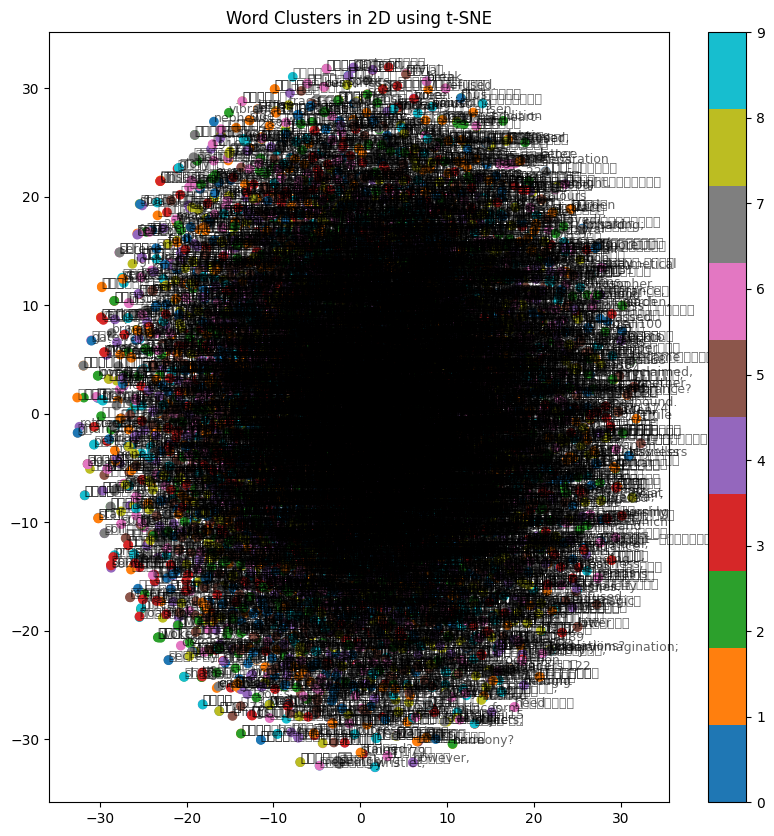

In [22]:
def cluster_words(model, idx_to_word, n_clusters=10):
    embeddings = model.embeddings.weight.detach().numpy()
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(embeddings)
    clusters = {i: [] for i in range(n_clusters)}
    for i, label in enumerate(kmeans.labels_):
        word = idx_to_word[i]
        clusters[label].append(word)
    return clusters, kmeans.labels_, embeddings

def plot_clusters_2d(embeddings, labels, idx_to_word):
    tsne = TSNE(n_components=2, random_state=42)
    reduced_embeddings = tsne.fit_transform(embeddings)
    plt.figure(figsize=(10, 10))
    scatter = plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=labels, cmap='tab10')
    for i, label in enumerate(labels):
        word = idx_to_word[i]
        plt.annotate(word, (reduced_embeddings[i, 0], reduced_embeddings[i, 1]), fontsize=9, alpha=0.6)
    plt.colorbar(scatter)
    plt.title('Word Clusters in 2D using t-SNE')
    plt.show()

n_clusters = 10
clusters, labels, embeddings = cluster_words(model, idx_to_word, n_clusters)
plot_clusters_2d(embeddings, labels, idx_to_word)

c:\Users\PC\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 2503 (\N{BENGALI VOWEL SIGN E}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\PC\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Matplotlib currently does not support Bengali natively.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\PC\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 2495 (\N{BENGALI VOWEL SIGN I}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\PC\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 2476 (\N{BENGALI LETTER BA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\PC\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 248

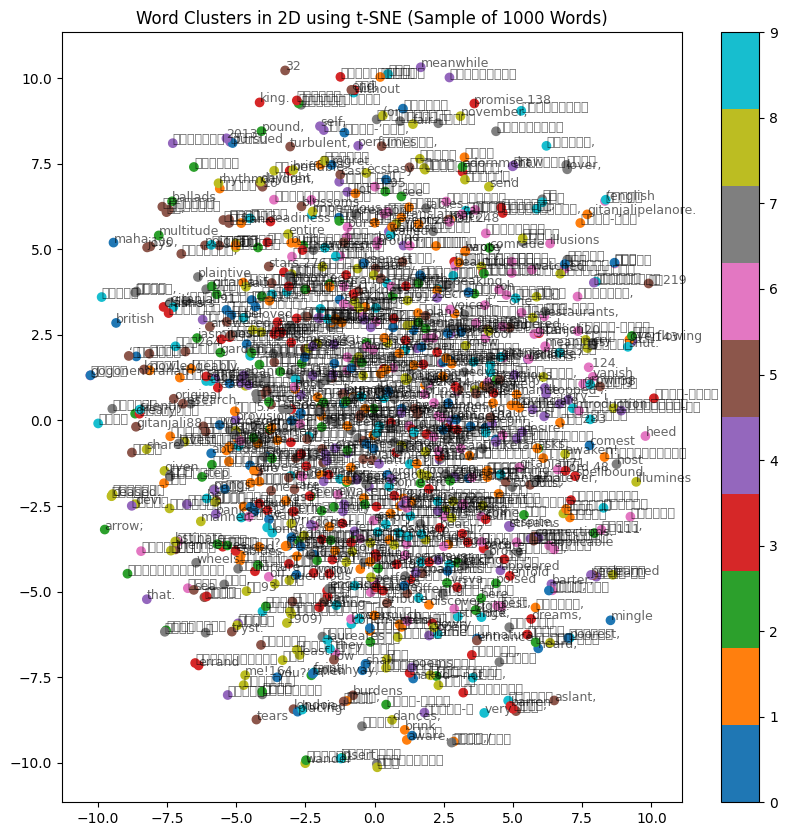

In [23]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import random
def cluster_words(model, idx_to_word, n_clusters=10):
    embeddings = model.embeddings.weight.detach().numpy()
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(embeddings)
    clusters = {i: [] for i in range(n_clusters)}
    for i, label in enumerate(kmeans.labels_):
        word = idx_to_word[i]
        clusters[label].append(word)
    return clusters, kmeans.labels_, embeddings
def plot_clusters_2d(embeddings, labels, idx_to_word, n_samples=1000):
    indices = random.sample(range(len(embeddings)), min(n_samples, len(embeddings)))
    sampled_embeddings = embeddings[indices]
    sampled_labels = labels[indices]
    sampled_words = [idx_to_word[i] for i in indices]
    
    tsne = TSNE(n_components=2, random_state=42)
    reduced_embeddings = tsne.fit_transform(sampled_embeddings)

    plt.figure(figsize=(10, 10))
    scatter = plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=sampled_labels, cmap='tab10')
    for i, word in enumerate(sampled_words):
        plt.annotate(word, (reduced_embeddings[i, 0], reduced_embeddings[i, 1]), fontsize=9, alpha=0.6)

    plt.colorbar(scatter)
    plt.title(f'Word Clusters in 2D using t-SNE (Sample of {n_samples} Words)')
    plt.show()

n_clusters = 10
clusters, labels, embeddings = cluster_words(model, idx_to_word, n_clusters)
plot_clusters_2d(embeddings, labels, idx_to_word, n_samples=1000)

In [24]:
import pandas as pd
word_sim_353_df = pd.read_csv('wordsim353crowd.csv')
print(word_sim_353_df.head())
print(word_sim_353_df.columns)

         Word 1     Word 2  Human (Mean)
0     admission     ticket        5.5360
1       alcohol  chemistry        4.1250
2      aluminum      metal        6.6250
3  announcement     effort        2.0625
4  announcement       news        7.1875
Index(['Word 1', 'Word 2', 'Human (Mean)'], dtype='object')


In [25]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import cosine_similarity

def evaluate_word_sim_mse(model, word_sim_df, word_to_idx):
    actual_similarities = []
    predicted_similarities = []
    
    for _, row in word_sim_df.iterrows():
        word1 = row['Word 1']
        word2 = row['Word 2']
        human_similarity = row['Human (Mean)']
        
        if word1 in word_to_idx and word2 in word_to_idx:
            word1_embedding = model.embeddings.weight[word_to_idx[word1]].detach().numpy()
            word2_embedding = model.embeddings.weight[word_to_idx[word2]].detach().numpy()
            similarity = cosine_similarity([word1_embedding], [word2_embedding])[0][0]
            actual_similarities.append(human_similarity)
            predicted_similarities.append(similarity)
    
    mse = mean_squared_error(actual_similarities, predicted_similarities)
    return mse

mse_error = evaluate_word_sim_mse(model, word_sim_353_df, word_to_idx)
print(f"Mean Squared Error on WordSim-353: {mse_error}")

Mean Squared Error on WordSim-353: 22.06975209465618
